### Датасет: https://www.kaggle.com/datasets/techsash/waste-classification-data
#### Предлагается по изображению определить относится объект к перерабатываемым отходам (Organic, O) или к неперабатываемым отходам (Recycle)
#### 25077 изображений: Train (Organic 12565, Recycle 9999), Test (Organic 1401, Recycle 1112)

### Загрузка датасета и его визуализация

In [1]:
! pip install torchinfo -q

In [2]:
import kagglehub
techsash_waste_classification_data_path = kagglehub.dataset_download('techsash/waste-classification-data')

print('Data source import complete.')
print(techsash_waste_classification_data_path)

Data source import complete.
/home/michael/.cache/kagglehub/datasets/techsash/waste-classification-data/versions/1


In [3]:
import os

In [4]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
import torchinfo
from torch import nn, optim

import torch.nn.functional as F

In [5]:
import torchvision.models as models

In [6]:
import random

In [7]:
train_dir = techsash_waste_classification_data_path + '/DATASET/TRAIN'
test_dir = techsash_waste_classification_data_path + '/DATASET/TEST'

In [8]:
checkpoint_dir = os.path.abspath('checkpoints')
os.makedirs(checkpoint_dir, exist_ok=True)

In [9]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [10]:
transform = transforms.Compose([transforms.Resize((224, 224)), transforms.ToTensor(),])

In [11]:
train_dataset = datasets.ImageFolder(root=train_dir, transform=transform)

test_dataset = datasets.ImageFolder(root=test_dir,transform=transform)

In [12]:
def show_dataset(dataloader, class_names=None, nrow=8, number=16):
    temp = [dataloader[random.randint(0, len(dataloader) - 1)] for _ in range(number)]

    images = [temp[i][0] for i in range(number)]

    labels = [temp[i][1] for i in range(number)]

    grid = make_grid(images, nrow=nrow, pad_value=0.8)

    fig, ax = plt.subplots(figsize=(16, 12))
    ax.imshow(grid.numpy().transpose((1, 2, 0)))
    ax.axis('off')

    for i, (img, label) in enumerate(zip(images, labels)):
        row = i // nrow
        col = i % nrow
        ax.text(col * 224 + 30, row * 224 + 210,
                class_names[label],
                fontsize=10,
                bbox=dict(facecolor='white', alpha=0.7, boxstyle='round,pad=0.3'))

    plt.title(f'Batch Preview (Classes: {class_names})', fontsize=16, pad=20)
    plt.tight_layout()
    plt.show()

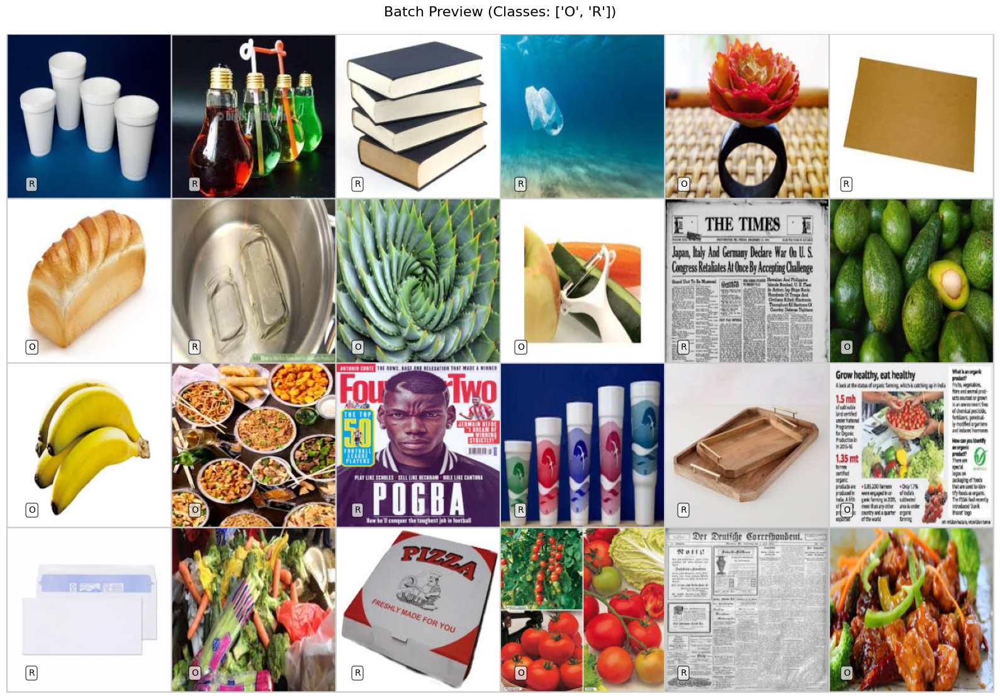

In [13]:
show_dataset(train_dataset, train_dataset.classes, 6, 24)

### Решение проблемы дисбаланса классов

In [14]:
import matplotlib.pyplot as plt
from collections import Counter

def plot_classes(dataset):
    class_counts = Counter(dataset.targets)

    classes = dataset.classes

    samples_per_class = [class_counts[i] for i in range(len(classes))]

    plt.figure(figsize=(10, 6))
    plt.bar(classes, samples_per_class, label='Dataset')
    plt.xlabel('Classes')
    plt.ylabel('Number of Samples')
    plt.title('Data Balance by Classes')
    plt.legend()
    plt.grid(True)
    plt.show()

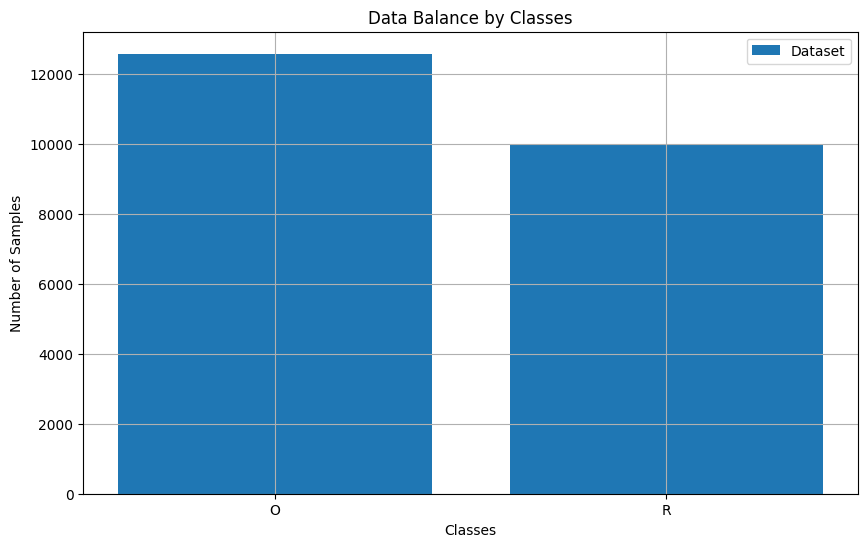

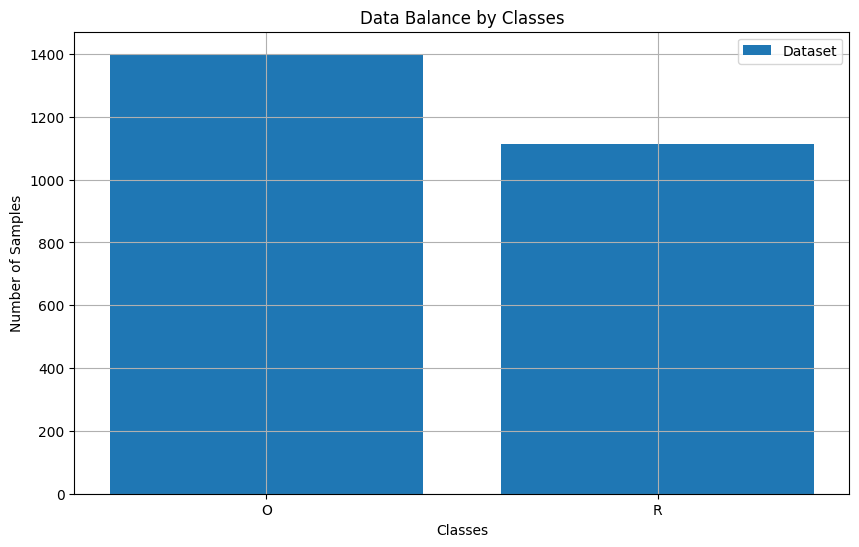

In [15]:
plot_classes(train_dataset)
plot_classes(test_dataset)

#### Аугментация, дополнение миноритарного класса до такого состояния, чтобы классы были одинаковы по размеру.
#### Основные случайные трансформации изображений при аугментации: обрезка, поворот, добавление чёрного квадрата (артефакт).

In [ ]:
import torchvision.transforms.functional as tvF

class RandomSquareArtifact:
    def __init__(self, num_squares=3, max_size=30, fill_value=0):
        self.num_squares = num_squares
        self.max_size = max_size
        self.fill_value = fill_value
    
    def __call__(self, img):
        if not isinstance(img, torch.Tensor):
            img = tvF.to_tensor(img)
        
        _, h, w = img.shape
        
        for _ in range(self.num_squares):
            square_size = random.randint(10, self.max_size)
            
            x = random.randint(0, w - square_size)
            y = random.randint(0, h - square_size)
            
            img[:, y:y+square_size, x:x+square_size] = self.fill_value
        
        return img

class AugmentedSubset(torch.utils.data.Dataset):
    def __init__(self, subset, transform=None):
        self.subset = subset
        self.transform = transform
        
    def __getitem__(self, idx):
        image, target = self.subset[idx]
        if self.transform:
            image = self.transform(image)
        return image, target
        
    def __len__(self):
        return len(self.subset)

class_r_samples = []
class_o_samples = []

for idx, target in enumerate(train_dataset.targets):
    if target == 1:
        class_r_samples.append(idx)
    else:
        class_o_samples.append(idx)

dataset_class_r = torch.utils.data.Subset(train_dataset, class_r_samples)
dataset_class_o = torch.utils.data.Subset(train_dataset, class_o_samples)

print("До аугментации:")
print("Класс R:", len(dataset_class_r))
print("Класс O:", len(dataset_class_o))

num_class_r_samples = len(dataset_class_r)
desired_num_class_r_samples = len(dataset_class_o)

oversampled_indices = list(range(num_class_r_samples))
additional_samples_needed = desired_num_class_r_samples - num_class_r_samples

augmented_indices = oversampled_indices * int(additional_samples_needed / num_class_r_samples) + \
                    oversampled_indices[:additional_samples_needed % num_class_r_samples]

original_r_subset = torch.utils.data.Subset(dataset_class_r, oversampled_indices)
augmented_r_subset = torch.utils.data.Subset(dataset_class_r, augmented_indices)

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=30),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    RandomSquareArtifact(num_squares=1, max_size=60, fill_value=0),
])

base_transform = transforms.Lambda(lambda x: x)

oversampled_class_r = torch.utils.data.ConcatDataset([
    AugmentedSubset(original_r_subset, base_transform),
    AugmentedSubset(augmented_r_subset, train_transform)
])

class BalancedDataset(torch.utils.data.Dataset):
    def __init__(self, dataset_r, dataset_o):
        self.dataset_r = dataset_r
        self.dataset_o = dataset_o
        self.targets = [0] * len(dataset_r) + [1] * len(dataset_o)
        
    def __len__(self):
        return len(self.dataset_r) + len(self.dataset_o)
    
    def __getitem__(self, idx):
        if idx < len(self.dataset_r):
            return self.dataset_r[idx]
        else:
            return self.dataset_o[idx - len(self.dataset_r)]
    
    @property
    def classes(self):
        return ['O', 'R']

balanced_train_dataset = BalancedDataset(oversampled_class_r, dataset_class_o)

print("После аугментации:")
print("Класс R:", len(oversampled_class_r))
print("Класс O:", len(dataset_class_o))

До аугментации:
Класс R: 9999
Класс O: 12565
После аугментации:
Класс R: 12565
Класс O: 12565


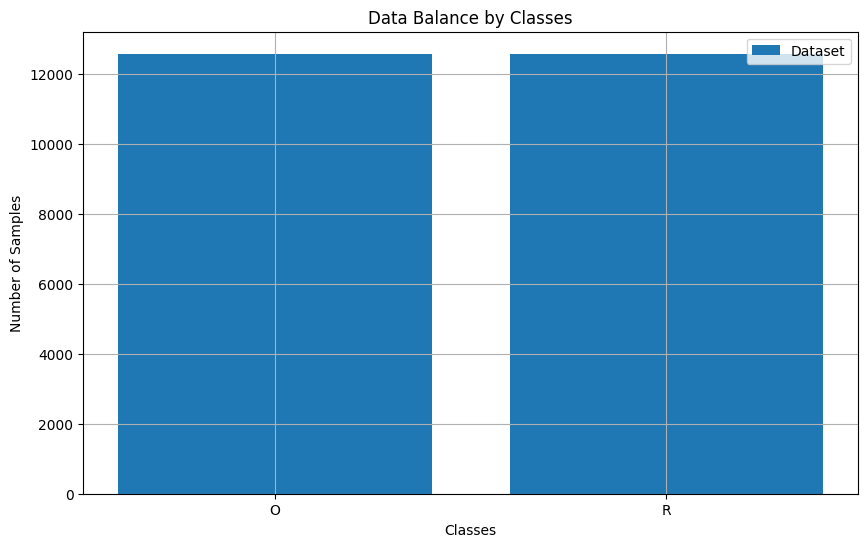

In [17]:
plot_classes(balanced_train_dataset)

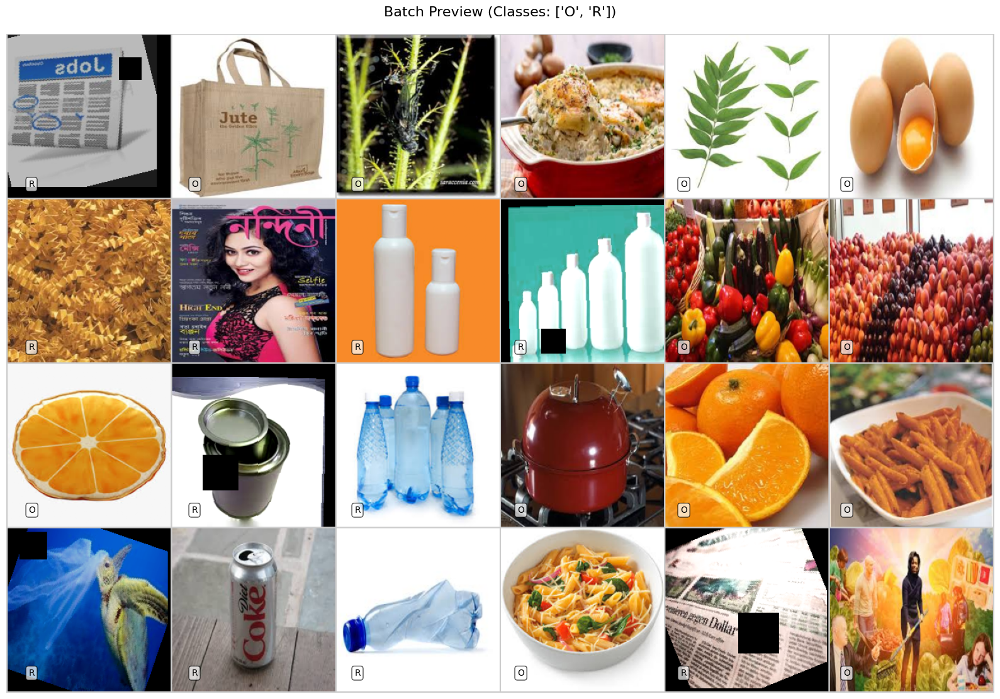

In [18]:
show_dataset(balanced_train_dataset, balanced_train_dataset.classes, 6, 24)

#### Создание загрузчиков данных

In [19]:
batch_size = 32

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=False,
    pin_memory=True
)

### Нейросеть

#### Пробовались нейросети: mobilenet_v3_small, mobilenet_v3_large, efficientnet_b0. По соотношению скорость/качество mobilenet_v3_small оказалась лучшей.
#### Последний слой классификатор заменяется на классификатор с 2-мя выходами. Веса в остальных слоях замораживаются.

In [20]:
model = models.mobilenet_v3_small(weights='MobileNet_V3_Small_Weights.IMAGENET1K_V1')

for param in model.parameters():
        param.requires_grad = False

model.to(device)

MobileNetV3(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): SqueezeExcitation(
          (avgpool): AdaptiveAvgPool2d(output_size=1)
          (fc1): Conv2d(16, 8, kernel_size=(1, 1), stride=(1, 1))
          (fc2): Conv2d(8, 16, kernel_size=(1, 1), stride=(1, 1))
          (activation): ReLU()
          (scale_activation): Hardsigmoid()
        )
        (2): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), 

In [21]:
model.classifier[3] = nn.Linear(1024, 2)

In [22]:
torchinfo.summary(model, input_size=(1,3,224,224))

Layer (type:depth-idx)                             Output Shape              Param #
MobileNetV3                                        [1, 2]                    --
├─Sequential: 1-1                                  [1, 576, 7, 7]            --
│    └─Conv2dNormActivation: 2-1                   [1, 16, 112, 112]         --
│    │    └─Conv2d: 3-1                            [1, 16, 112, 112]         (432)
│    │    └─BatchNorm2d: 3-2                       [1, 16, 112, 112]         (32)
│    │    └─Hardswish: 3-3                         [1, 16, 112, 112]         --
│    └─InvertedResidual: 2-2                       [1, 16, 56, 56]           --
│    │    └─Sequential: 3-4                        [1, 16, 56, 56]           (744)
│    └─InvertedResidual: 2-3                       [1, 24, 28, 28]           --
│    │    └─Sequential: 3-5                        [1, 24, 28, 28]           (3,864)
│    └─InvertedResidual: 2-4                       [1, 24, 28, 28]           --
│    │    └─Sequential

#### Было замечено, что аугментации недостаточно для повышения точности определения класса Recycle, установка весов для классов улучшает положение.

In [ ]:
class_weights = torch.tensor([1.0, 3.0], device=device)

In [24]:
optimizer = optim.Adam(model.classifier[3].parameters())
criterion = nn.CrossEntropyLoss(weight=class_weights)

### Обучающий цикл

In [25]:
! pip install pillow -q
! pip install pytorch-ignite -q
! pip install tabulate -q

In [26]:
from ignite.engine import Engine, Events, create_supervised_trainer, create_supervised_evaluator
from ignite.metrics import Accuracy, Loss, Precision, Recall, Fbeta, ConfusionMatrix
from ignite.handlers import ModelCheckpoint, EarlyStopping, Timer
from ignite.contrib.handlers import ProgressBar
import seaborn as sns
from sklearn.metrics import confusion_matrix

from PIL import Image

import tabulate

In [27]:
def prepare_batch(batch, device):
    x, y = batch
    return x.to(device), y.long().to(device)

def train_step(engine, batch):
    model.train()
    x, y = prepare_batch(batch, device)
    optimizer.zero_grad()
    y_pred = model(x)
    loss = criterion(y_pred, y)
    loss.backward()
    optimizer.step()
    return loss.item()

def validation_step(engine, batch):
    model.eval()
    with torch.no_grad():
        x, y = prepare_batch(batch, device)
        y_pred = model(x)
        return y_pred, y

In [28]:
trainer = Engine(train_step)
evaluator = Engine(validation_step)

#### Установление метрик и их визуалиции на каждой эпохе

In [29]:
metrics = {
    'loss': Loss(criterion),
    'accuracy': Accuracy(),
    'precision': Precision(average=True),
    'recall': Recall(average=True),
    'f1': Fbeta(beta=1.0, average=True),
    'confusion_matrix': ConfusionMatrix(num_classes=2),
}

for name, metric in metrics.items():
    metric.attach(evaluator, name)

In [30]:
def plot_confusion_matrix(cm, class_names):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

def plot_metrics_history(train_losses, val_metrics):
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))

    ax1.plot(train_losses, label='Train Loss')
    ax1.set_title('Training Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()

    ax2.plot(val_metrics['accuracy'], label='Validation Accuracy')
    ax2.set_title('Validation Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.legend()

    ax3.plot(val_metrics['f1'], label='F1 Score', color='green')
    ax3.set_title('F1 Score')
    ax3.set_xlabel('Epoch')
    ax3.set_ylabel('F1')
    ax3.legend()

    ax4.plot(val_metrics['precision'], label='Precision', color='red')
    ax4.plot(val_metrics['recall'], label='Recall', color='blue')
    ax4.set_title('Precision and Recall')
    ax4.set_xlabel('Epoch')
    ax4.set_ylabel('Score')
    ax4.legend()

    plt.tight_layout()
    plt.show()

In [31]:
pbar = ProgressBar()
pbar.attach(trainer, output_transform=lambda x: {'loss': x})

early_stopping = EarlyStopping(
    patience=5,
    score_function=lambda engine: engine.state.metrics['f1'],
    trainer=trainer
)

#evaluator.add_event_handler(Events.COMPLETED, early_stopping)

#### Создание логгеров с сохранением весов модели на каждой эпохе

In [32]:
train_losses = []
val_metrics_history = {
    'accuracy': [], 'precision': [], 'recall': [],
    'f1': [], 'loss': []
}

@trainer.on(Events.EPOCH_COMPLETED)
def log_training_results(engine):
    evaluator.run(train_loader)
    metrics = evaluator.state.metrics
    print(f"Training Results - Epoch: {engine.state.epoch}")
    print(f"Accuracy: {metrics['accuracy']:.4f} | Loss: {metrics['loss']:.4f} | F1: {metrics['f1']:.4f}")

@trainer.on(Events.EPOCH_COMPLETED)
def log_validation_results(engine):
    global checkpoint_handler
    evaluator.run(test_loader)
    metrics = evaluator.state.metrics

    for key in val_metrics_history:
        val_metrics_history[key].append(metrics[key])

    print(f"Validation Results - Epoch: {engine.state.epoch}")
    print(f"Accuracy: {metrics['accuracy']:.4f} | Loss: {metrics['loss']:.4f}")
    print(f"Precision: {metrics['precision']:.4f} | Recall: {metrics['recall']:.4f}")
    print(f"F1: {metrics['f1']:.4f}")

    cm = metrics['confusion_matrix']
    print_confusion_matrix(cm.numpy(), ['Organic', 'Recycle'])

    checkpoint = {
        'model': model.state_dict(),
        'optimizer': optimizer.state_dict(),
        'epoch': engine.state.epoch,
        'val_f1': metrics['f1'],
        'val_accuracy': metrics['accuracy']
    }
    
    torch.save(checkpoint, f'checkpoints/model_epoch_{engine.state.epoch}_f1_{metrics["f1"]:.4f}.pth')

@trainer.on(Events.ITERATION_COMPLETED)
def log_loss(engine):
    train_losses.append(engine.state.output)

@trainer.on(Events.COMPLETED)
def final_results(engine):
    print("\n=== FINAL RESULTS ===")
    print(f"Best validation accuracy: {max(val_metrics_history['accuracy']):.4f}")
    print(f"Best F1 score: {max(val_metrics_history['f1']):.4f}")

    plot_metrics_history(train_losses, val_metrics_history)

    evaluator.run(test_loader)
    cm = evaluator.state.metrics['confusion_matrix']
    plot_confusion_matrix(cm.numpy(), ['Organic', 'Recycle'])

def print_confusion_matrix(cm, class_names):
    print("Confusion Matrix:")
    headers = ["Actual/Predicted"] + class_names
    table_data = []
    
    for i, class_name in enumerate(class_names):
        row = [class_name] + [str(int(cm[i][j])) for j in range(len(class_names))]
        table_data.append(row)
    
    print(tabulate.tabulate(table_data, headers=headers, tablefmt="grid"))
    print()

In [33]:
def evaluate_model(model, loader, evaluator, val_metrics_history):
    evaluator.run(loader)
    model.eval();
    metrics = evaluator.state.metrics

    for key in val_metrics_history:
        val_metrics_history[key].append(metrics[key])

    print(f"\n=== EVALUATION RESULTS ===")
    print(f"Accuracy: {metrics['accuracy']:.4f} | Loss: {metrics['loss']:.4f}")
    print(f"Precision: {metrics['precision']:.4f} | Recall: {metrics['recall']:.4f}")
    print(f"F1: {metrics['f1']:.4f}")

    cm = metrics['confusion_matrix']
    plot_confusion_matrix(cm.numpy(), ['Organic', 'Recycle'])

    print("\n=== FINAL RESULTS ===")
    print(f"Test accuracy: {metrics['accuracy']:.4f}")
    print(f"Test F1 score: {metrics['f1']:.4f}")

In [34]:
def show_predictions(test_dir, model, transform, class_names=['Organic', 'Recycle'], 
                    nrow=4, number=16, device=device):
    
    original_state = random.getstate()
    random.seed(0)
    
    all_images = []
    for root, dirs, files in os.walk(test_dir):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                true_class = os.path.basename(root)
                all_images.append((os.path.join(root, file), true_class))
    
    selected_samples = random.sample(all_images, min(number, len(all_images)))
    random.setstate(original_state)
    
    images = []
    predictions = []
    true_labels = []
    confidences = []
    
    model.eval()

    for img_path, true_class in selected_samples:
        image = Image.open(img_path).convert('RGB')
        image_tensor = transform(image).unsqueeze(0).to(device)
        
        with torch.no_grad():
            prediction = model(image_tensor)
            probabilities = F.softmax(prediction, dim=1)
            max_prob, class_idx = torch.max(probabilities, 1)

        images.append(image_tensor.cpu()[0])
        predictions.append(class_idx.item())
        confidences.append(max_prob.item())
        
        if true_class.upper() == 'R' or 'RECYCLE' in true_class.upper():
            true_labels.append(1)
        else:
            true_labels.append(0)

    grid = make_grid(images, nrow=nrow, pad_value=0.8)
    
    fig, ax = plt.subplots(figsize=(16, 12))
    ax.imshow(grid.numpy().transpose((1, 2, 0)))
    ax.axis('off')

    for i, (img, pred, true, conf) in enumerate(zip(images, predictions, true_labels, confidences)):
        row = i // nrow
        col = i % nrow
        
        color = 'green' if pred == true else 'red'

        pred_name = class_names[pred]
        true_name = class_names[true]
        status = "✓" if pred == true else "✗"
        
        text = f"{status} Pred: {pred_name}\nTrue: {true_name}\nConf: {conf*100:.1f}%"
        
        ax.text(col * 224 + 20, row * 224 + 200, text,
                fontsize=9,
                bbox=dict(facecolor='white', alpha=0.9, boxstyle='round,pad=0.3'),
                color=color,
                fontweight='bold')
    
    plt.title('Predictions Results (Green=Correct, Red=Incorrect)', fontsize=16, pad=20)
    plt.tight_layout()
    plt.show()

### Обучение

#### Качество предсказаний до обучения (метрики)


=== EVALUATION RESULTS ===
Accuracy: 0.6005 | Loss: 0.6556
Precision: 0.5916 | Recall: 0.5813
F1: 0.5774


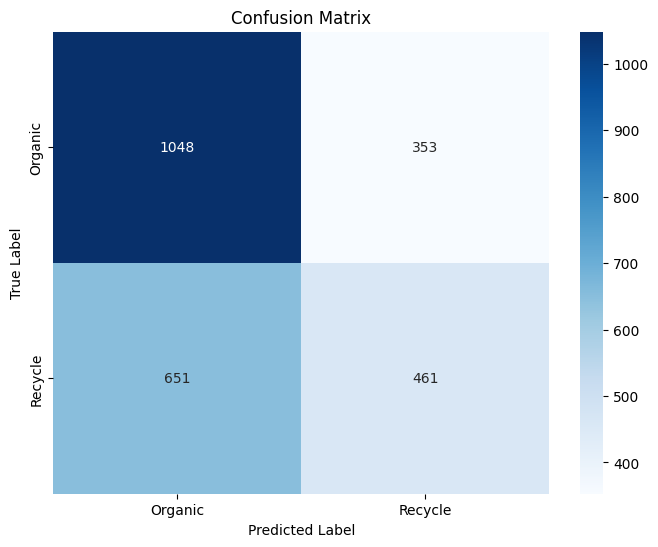


=== FINAL RESULTS ===
Test accuracy: 0.6005
Test F1 score: 0.5774


In [35]:
evaluate_model(model, test_loader, evaluator, val_metrics_history)

#### Качество предсказаний до обучения (визуализация)

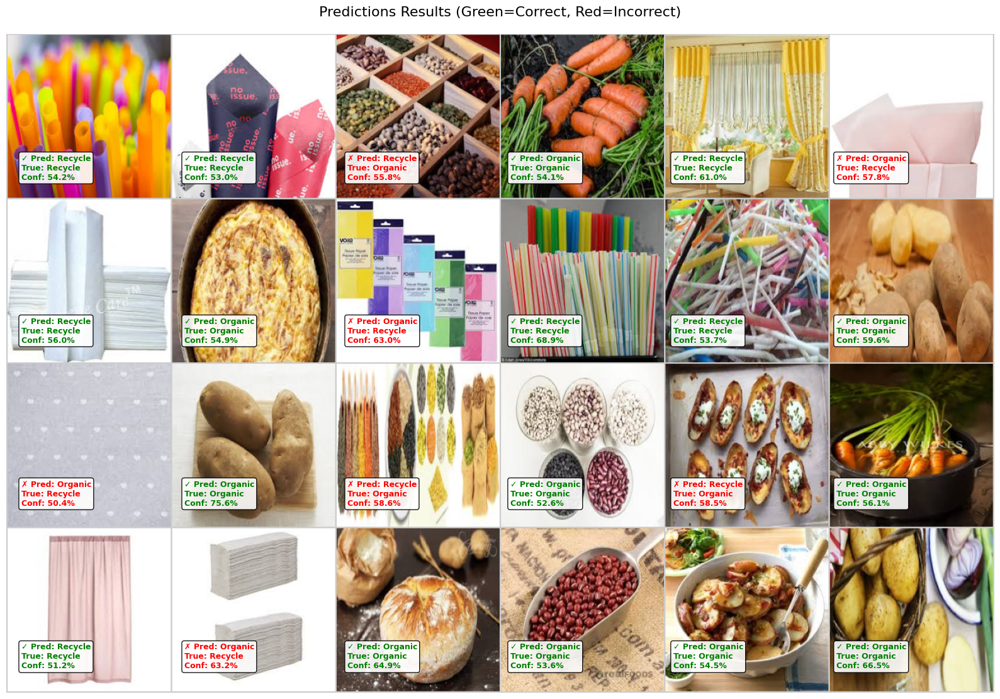

In [36]:
show_predictions(test_dir, model, transform, nrow=6, number=24)

#### Обучение и вывод истории обучения

[1/706]   0%|           [00:00<?]

Training Results - Epoch: 1
Accuracy: 0.9187 | Loss: 0.1670 | F1: 0.9183
Validation Results - Epoch: 1
Accuracy: 0.9276 | Loss: 0.2094
Precision: 0.9278 | Recall: 0.9252
F1: 0.9264
Confusion Matrix:
+--------------------+-----------+-----------+
| Actual/Predicted   |   Organic |   Recycle |
+====================+===========+===========+
| Organic            |      1325 |        76 |
+--------------------+-----------+-----------+
| Recycle            |       106 |      1006 |
+--------------------+-----------+-----------+



[1/706]   0%|           [00:00<?]

Training Results - Epoch: 2
Accuracy: 0.9141 | Loss: 0.1589 | F1: 0.9138
Validation Results - Epoch: 2
Accuracy: 0.9288 | Loss: 0.2070
Precision: 0.9271 | Recall: 0.9292
F1: 0.9280
Confusion Matrix:
+--------------------+-----------+-----------+
| Actual/Predicted   |   Organic |   Recycle |
+====================+===========+===========+
| Organic            |      1297 |       104 |
+--------------------+-----------+-----------+
| Recycle            |        75 |      1037 |
+--------------------+-----------+-----------+



[1/706]   0%|           [00:00<?]

Training Results - Epoch: 3
Accuracy: 0.9183 | Loss: 0.1549 | F1: 0.9180
Validation Results - Epoch: 3
Accuracy: 0.9244 | Loss: 0.2089
Precision: 0.9233 | Recall: 0.9235
F1: 0.9234
Confusion Matrix:
+--------------------+-----------+-----------+
| Actual/Predicted   |   Organic |   Recycle |
+====================+===========+===========+
| Organic            |      1305 |        96 |
+--------------------+-----------+-----------+
| Recycle            |        94 |      1018 |
+--------------------+-----------+-----------+



[1/706]   0%|           [00:00<?]

Training Results - Epoch: 4
Accuracy: 0.9235 | Loss: 0.1537 | F1: 0.9231
Validation Results - Epoch: 4
Accuracy: 0.9232 | Loss: 0.2111
Precision: 0.9234 | Recall: 0.9207
F1: 0.9219
Confusion Matrix:
+--------------------+-----------+-----------+
| Actual/Predicted   |   Organic |   Recycle |
+====================+===========+===========+
| Organic            |      1320 |        81 |
+--------------------+-----------+-----------+
| Recycle            |       112 |      1000 |
+--------------------+-----------+-----------+



[1/706]   0%|           [00:00<?]

Training Results - Epoch: 5
Accuracy: 0.9219 | Loss: 0.1508 | F1: 0.9216
Validation Results - Epoch: 5
Accuracy: 0.9276 | Loss: 0.2044
Precision: 0.9270 | Recall: 0.9261
F1: 0.9265
Confusion Matrix:
+--------------------+-----------+-----------+
| Actual/Predicted   |   Organic |   Recycle |
+====================+===========+===========+
| Organic            |      1315 |        86 |
+--------------------+-----------+-----------+
| Recycle            |        96 |      1016 |
+--------------------+-----------+-----------+



[1/706]   0%|           [00:00<?]

Training Results - Epoch: 6
Accuracy: 0.9195 | Loss: 0.1521 | F1: 0.9192
Validation Results - Epoch: 6
Accuracy: 0.9232 | Loss: 0.2098
Precision: 0.9225 | Recall: 0.9218
F1: 0.9221
Confusion Matrix:
+--------------------+-----------+-----------+
| Actual/Predicted   |   Organic |   Recycle |
+====================+===========+===========+
| Organic            |      1309 |        92 |
+--------------------+-----------+-----------+
| Recycle            |       101 |      1011 |
+--------------------+-----------+-----------+



[1/706]   0%|           [00:00<?]

Training Results - Epoch: 7
Accuracy: 0.9227 | Loss: 0.1510 | F1: 0.9224
Validation Results - Epoch: 7
Accuracy: 0.9176 | Loss: 0.2199
Precision: 0.9178 | Recall: 0.9150
F1: 0.9163
Confusion Matrix:
+--------------------+-----------+-----------+
| Actual/Predicted   |   Organic |   Recycle |
+====================+===========+===========+
| Organic            |      1314 |        87 |
+--------------------+-----------+-----------+
| Recycle            |       120 |       992 |
+--------------------+-----------+-----------+



[1/706]   0%|           [00:00<?]

Training Results - Epoch: 8
Accuracy: 0.9229 | Loss: 0.1514 | F1: 0.9226
Validation Results - Epoch: 8
Accuracy: 0.9252 | Loss: 0.2125
Precision: 0.9251 | Recall: 0.9231
F1: 0.9240
Confusion Matrix:
+--------------------+-----------+-----------+
| Actual/Predicted   |   Organic |   Recycle |
+====================+===========+===========+
| Organic            |      1319 |        82 |
+--------------------+-----------+-----------+
| Recycle            |       106 |      1006 |
+--------------------+-----------+-----------+



[1/706]   0%|           [00:00<?]

Training Results - Epoch: 9
Accuracy: 0.9245 | Loss: 0.1486 | F1: 0.9242
Validation Results - Epoch: 9
Accuracy: 0.9228 | Loss: 0.2059
Precision: 0.9219 | Recall: 0.9216
F1: 0.9217
Confusion Matrix:
+--------------------+-----------+-----------+
| Actual/Predicted   |   Organic |   Recycle |
+====================+===========+===========+
| Organic            |      1306 |        95 |
+--------------------+-----------+-----------+
| Recycle            |        99 |      1013 |
+--------------------+-----------+-----------+



[1/706]   0%|           [00:00<?]

Training Results - Epoch: 10
Accuracy: 0.9258 | Loss: 0.1508 | F1: 0.9254
Validation Results - Epoch: 10
Accuracy: 0.9248 | Loss: 0.2129
Precision: 0.9245 | Recall: 0.9229
F1: 0.9236
Confusion Matrix:
+--------------------+-----------+-----------+
| Actual/Predicted   |   Organic |   Recycle |
+====================+===========+===========+
| Organic            |      1316 |        85 |
+--------------------+-----------+-----------+
| Recycle            |       104 |      1008 |
+--------------------+-----------+-----------+


=== FINAL RESULTS ===
Best validation accuracy: 0.9288
Best F1 score: 0.9280


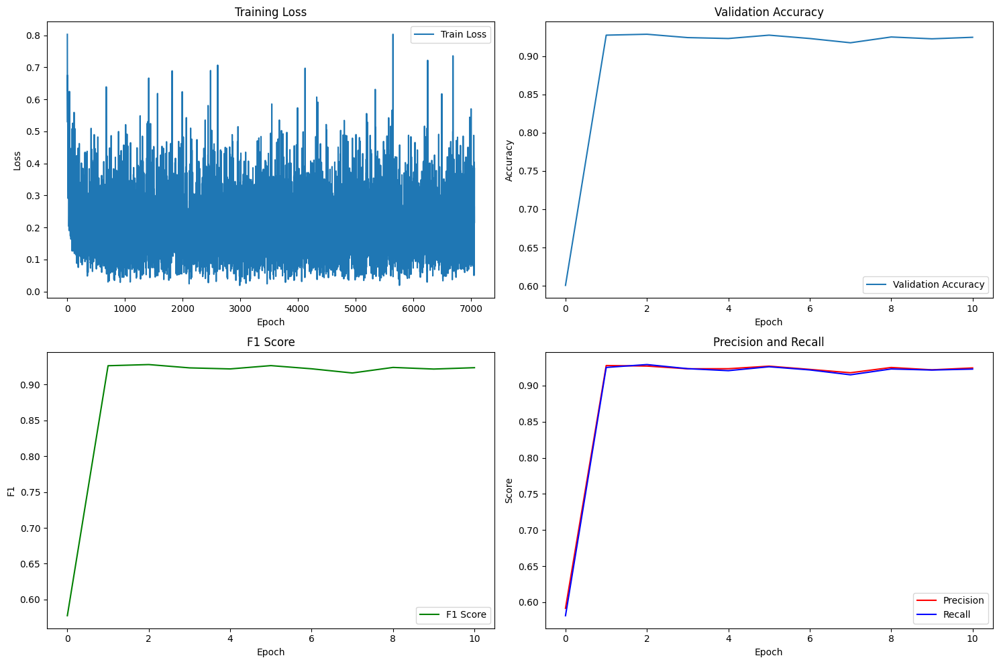

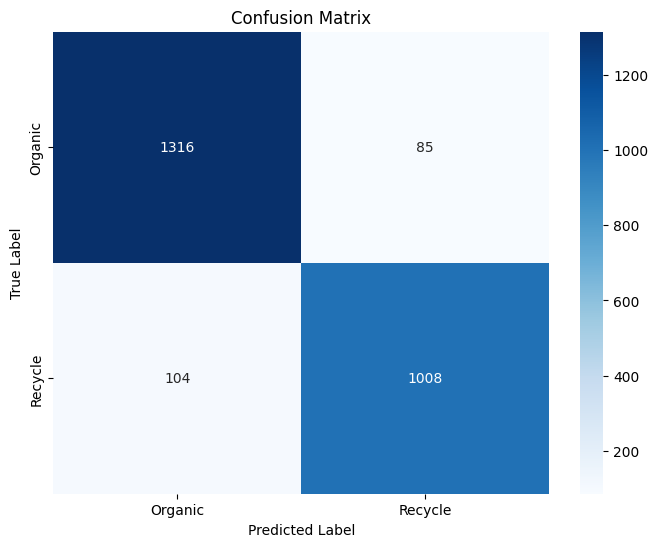

State:
	iteration: 7060
	epoch: 10
	epoch_length: 706
	max_epochs: 10
	output: 0.38419869542121887
	batch: <class 'list'>
	metrics: <class 'dict'>
	dataloader: <class 'torch.utils.data.dataloader.DataLoader'>
	seed: <class 'NoneType'>
	times: <class 'dict'>

In [37]:
trainer.run(train_loader, max_epochs=10)

### Результаты

#### Загрузка лучшей модели, её показатели и визуализация предсказания

In [41]:
model = models.mobilenet_v3_small(weights='MobileNet_V3_Small_Weights.IMAGENET1K_V1')

model.classifier[3] = nn.Linear(1024, 2)

optimizer = optim.Adam(model.parameters())
criterion = nn.CrossEntropyLoss()

checkpoint = torch.load('checkpoints/model_epoch_5_f1_0.9265.pth', map_location=device)
model.load_state_dict(checkpoint['model'])

model.to(device);


=== EVALUATION RESULTS ===
Accuracy: 0.9276 | Loss: 0.2044
Precision: 0.9270 | Recall: 0.9261
F1: 0.9265


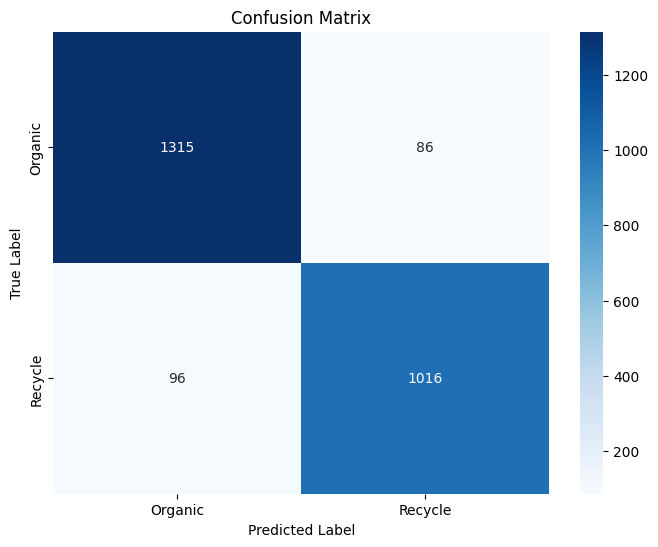


=== FINAL RESULTS ===
Test accuracy: 0.9276
Test F1 score: 0.9265


In [42]:
evaluate_model(model, test_loader, evaluator, val_metrics_history)

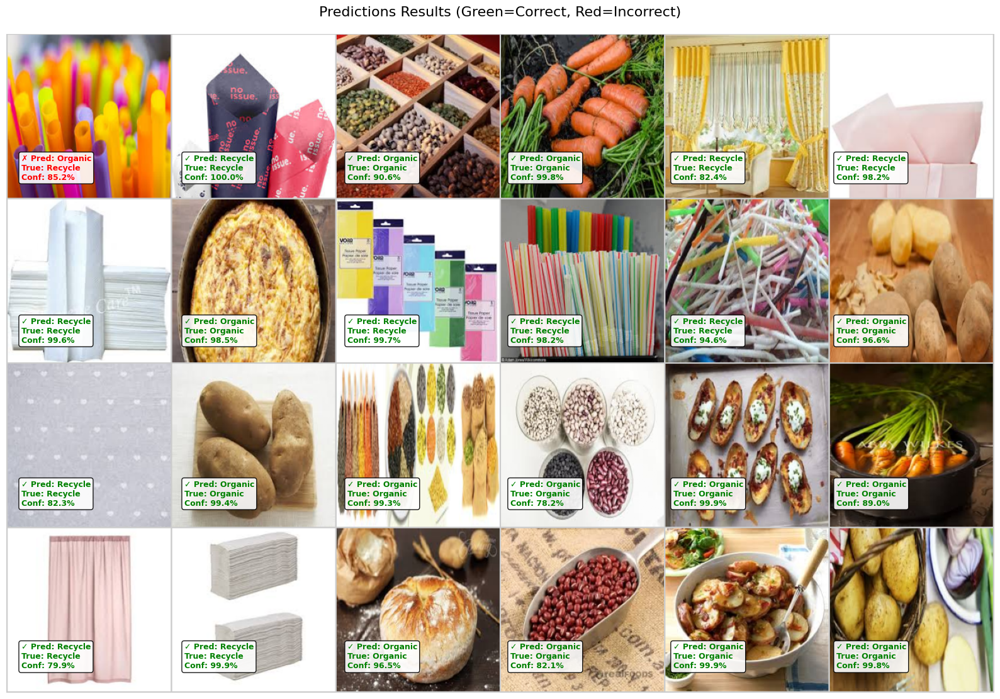

In [43]:
show_predictions(test_dir, model, transform, nrow=6, number=24)

### Выводы

#### Загруженная модель успешно дообучилась и достигла хорошего результата при классификации объектов по их принадлежности к классу отходов.
#### Аугмнетация и установление весов для классов помогло частично исправить проблему дисбаланса классов. Однако стоит заметить, что изображения для класса Recycle выглядят более сложными, чем для класса Organic (попадаются картинки на которых для определения класса отходов нужно знать материал объекта или на картинке присутствует много объектов и некоторые из них относятся к классу Organic, а не Recycle)